# Training Kmeans dengan k=6 dan data dpi=5

In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import time
import os
import sys
import random
import matplotlib.pyplot as plt

sys.path.append(os.path.abspath("../"))
from src.helper import show_clustered_image, prepend_zero

In [19]:
df = pd.read_csv("../datasets/cmyk-by-dpi.csv")
df = df[df['dpi'] == 5]

# Buat fitur sum
df['sum'] = df['c'] + df['m'] + df['y'] + df['k']

kmeans = KMeans(n_clusters=6)

# Mengubah dataframe menjadi 1 array dan reshape menjadi 2 dimensi
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df['sum'].to_numpy().reshape(-1,1))

start = time.time()
kmeans.fit(df_scaled)
print("Training finished in:", time.time() - start, 'second')

Training finished in: 0.11865592002868652 second


/Users/rasyidev/miniconda/envs/print-cost/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [20]:
df['label'] = kmeans.labels_
df

,page,dpi,processing_time,c,m,y,k,sum,label
6816,1,5,0.001745,54.36,0.03,53.03,44.63,152.05,1
6817,2,5,0.001834,0.00,0.00,0.00,0.09,0.09,3
6818,3,5,0.001309,3.31,0.23,9.03,3.73,16.30,0
6819,4,5,0.000801,0.00,0.00,0.00,3.10,3.10,3
6820,5,5,0.001701,0.00,0.00,0.00,4.25,4.25,3
...,...,...,...,...,...,...,...,...,...
7663,848,5,0.001077,0.00,0.00,0.00,0.09,0.09,3
7664,849,5,0.000960,1.15,0.30,1.81,4.22,7.48,3
7665,850,5,0.000798,1.11,0.32,1.90,3.90,7.23,3
7666,851,5,0.000722,0.00,0.00,0.00,0.09,0.09,3


In [21]:
df[['sum', 'label']].to_csv('../datasets/label_k6_5dpi.csv', index=False)

## Export KMeans dan StandardScaler instance

In [22]:
import pickle

pickle.dump([kmeans, scaler], open('../models/kmeans_and_scaler.pkl', 'wb'))

In [23]:
del kmeans, scaler, df

## Import KMeans dan StandardScaler instance

In [24]:
import pickle
kmeans, scaler = pickle.load(open('../models/kmeans_and_scaler.pkl', 'rb'))
kmeans.predict(scaler.transform([[24]]))

array([4], dtype=int32)

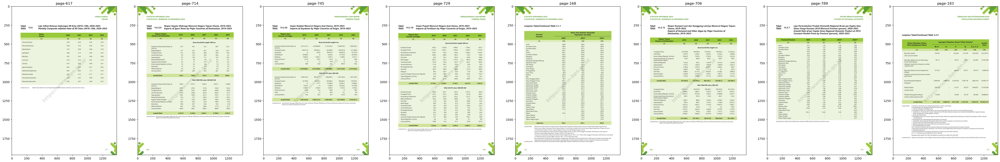

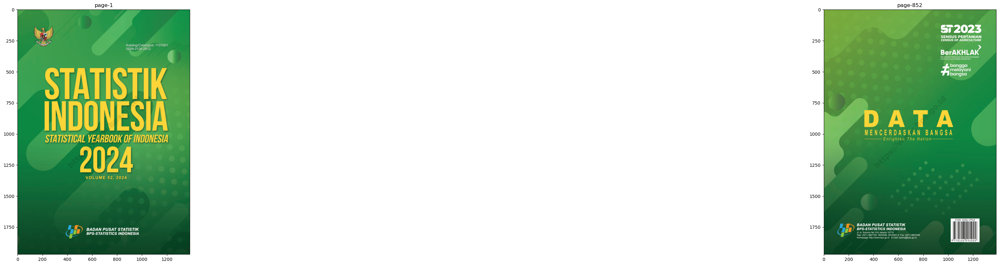

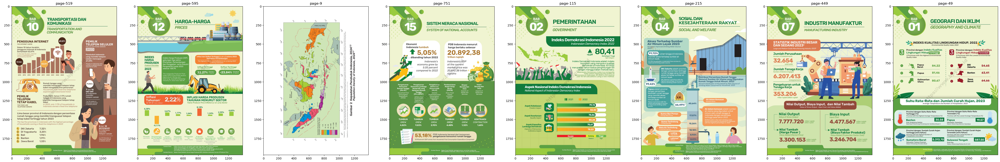

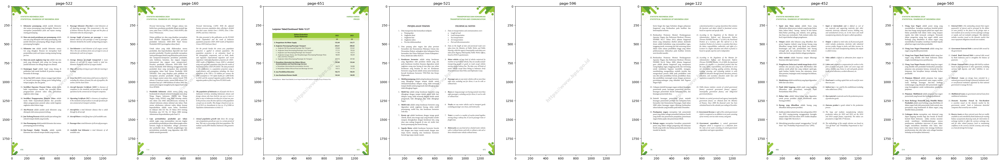

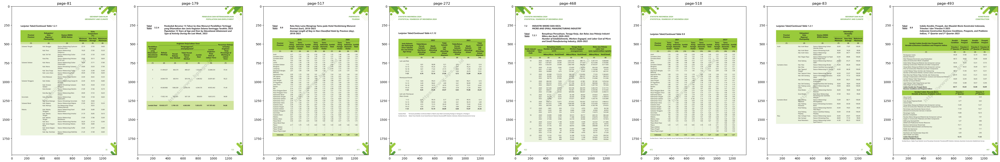

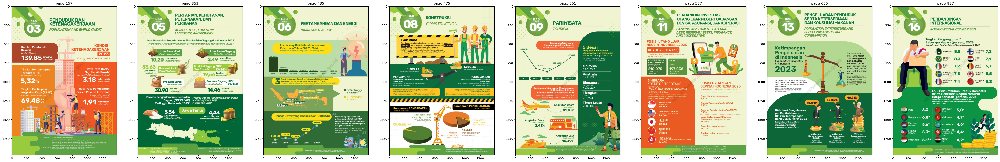

In [25]:
df = pd.read_csv("../datasets/label_k6_5dpi.csv")
for i in range(6):
    show_clustered_image(df, i)

## Export Label dan Harga

In [28]:
import json
price_label = {"prices":[1500, 2000, 2000, 500, 1000, 2000]}
json.dump(price_label, open('../models/price_label.json', 'w'))

In [27]:
df2 = pd.read_csv("../datasets/300dpi-6-cluster-with-label.csv")
df2

,Unnamed: 0,sum,label
0,0,157.95,3
1,1,0.07,2
2,2,15.69,0
3,3,2.99,2
4,4,4.03,2
...,...,...,...
847,847,0.07,2
848,848,7.15,2
849,849,6.86,2
850,850,0.07,2


In [14]:
df.iloc[[694,538,583,326,430],:]

,sum,label
694,18.12,0
538,20.01,0
583,15.76,5
326,16.91,5
430,20.52,0
